In [108]:
# Import basic modules
import os
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Import plotly modules to view time series in a more interactive way
import plotly.graph_objects as go
import pmdarima as pm
import scipy.stats as stats
import seaborn as sns
import sklearn

# Import regression and error metrics modules
import statsmodels.api as sm
from matplotlib import rcParams
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet, LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Importing time series split for cross validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, TimeSeriesSplit

# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import ols
from statsmodels.graphics import tsaplots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller


plt.style.use('bmh')

# special IPython command to prepare the notebook for matplotlib and other libraries
%matplotlib inline

### Functions

In [9]:
dict_error = dict()

In [10]:
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed energy consumption against the predicted energy consumption
    """
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.scatter(truth, pred)
    _ = plt.xlabel("Observed energy in MWH")
    _ = plt.ylabel("Predicted energy in MWH")
    _ = plt.title("Observed vs Predicted energy using model {}".format(model_name))
    _ = plt.xlim(1000, 5000)
    _ = plt.ylim(1000, 5000)
    # plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)


In [11]:
def error_metrics(y_pred, y_truth, model_name=None, test=True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score,
    MAE (mean absolute error), MAPE (mean absolute % error).

    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation

    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()

    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()

    print("\nError metrics for model {}".format(model_name))

    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)

    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print("Variance score: %.2f" % R2)

    MAE = mean_absolute_error(y_truth, y_pred)
    print("Mean Absolute Error: %.2f" % MAE)

    MAPE = np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100
    print("Mean Absolute Percentage Error: %.2f %%" % MAPE)

    # Appending the error values along with the model_name to the dict
    if test:
        train_test = "test"
    else:
        train_test = "train"

    # df = pd.DataFrame({'model': model_name, 'RMSE':RMSE, 'R2':R2, 'MAE':MAE, 'MAPE':MAPE}, index=[0])
    name_error = ["model", "train_test", "RMSE", "R2", "MAE", "MAPE"]
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))

    for error in list_error:
        if error[0] in dict_error:
            # append the new number to the existing array at this slot
            dict_error[error[0]].append(error[1])
        else:
            # create a new array in this slot
            dict_error[error[0]] = [error[1]]
    # return(dict_error)


In [12]:
def plot_timeseries(ts, title="og", opacity=1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=ts.index, y=ts.values, name="observed", line_color="lightslategrey", opacity=opacity))

    fig.update_layout(title_text=title, xaxis_rangeslider_visible=True)
    fig.show()


In [13]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity=0.5, pred_ts_opacity=0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=og_ts.index, y=np.array(og_ts.values), name="Observed", line_color="deepskyblue", opacity=og_ts_opacity
        )
    )

    try:
        fig.add_trace(
            go.Scatter(
                x=pred_ts.index, y=pred_ts, name=model_name, line_color="lightslategrey", opacity=pred_ts_opacity
            )
        )
    except:  # if predicted values are a numpy array they won't have an index
        fig.add_trace(
            go.Scatter(x=og_ts.index, y=pred_ts, name=model_name, line_color="lightslategrey", opacity=pred_ts_opacity)
        )

    # fig.add_trace(go)
    fig.update_layout(
        title_text="Observed test set vs predicted energy MWH values using {}".format(model_name),
        xaxis_rangeslider_visible=True,
    )
    fig.show()


In [14]:
def train_test(data, test_size=0.15, scale=False, cols_to_transform=None, include_test_scale=False):
    """

    Perform train-test split with respect to time series structure

    - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
    - test_size: size of test set
    - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
    - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
      the StandardScaler fits only on the training set.

    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df) * (1 - test_size))

    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])

    X_train = df.drop("SDGE", axis=1).iloc[:test_index]
    y_train = df.SDGE.iloc[:test_index]
    X_test = df.drop("SDGE", axis=1).iloc[test_index:]
    y_test = df.SDGE.iloc[test_index:]

    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])

    return X_train, X_test, y_train, y_test


In [37]:
def time_of_day(x):
    if x in hour_dict["morning"]:
        return "morning"
    elif x in hour_dict["afternoon"]:
        return "afternoon"
    elif x in hour_dict["evening"]:
        return "evening"
    else:
        return "night"


In [42]:
def trend_model(
    data, cols_to_transform, l1_space, alpha_space, cols_use=0, scale=True, test_size=0.15, include_test_scale=False
):
    """
    Tuning, fitting and predicting with an Elastic net regression model.
    data: time series dataframe including X and y variables
    col_use: columns including the y variable to be used from the data
    cols_to_transform: columns to be scaled using StandardScaler if scale = True
    l1_space: potential values to try for the l1_ratio parameter of the elastic net regression
    include_test_scale: If True then the StandardScaler will be fit on the entire dataset instead of just the training set

    A note about l1_ratio: The ElasticNet mixing parameter, with 0 <= l1_ratio <= 1.
    For l1_ratio = 0 the penalty is an L2 penalty. For l1_ratio = 1 it is an L1 penalty.
    For 0 < l1_ratio < 1, the penalty is a combination of L1 and L2.
    """

    # Creating the train test split
    if cols_use != 0:
        df = data[cols_use]
    else:
        df = data

    X_train, X_test, y_train, y_test = train_test(
        df, test_size=test_size, scale=scale, cols_to_transform=cols_to_transform, include_test_scale=include_test_scale
    )

    # Create the hyperparameter grid
    # l1_space = np.linspace(0, 1, 50)
    param_grid = {"l1_ratio": l1_space, "alpha": alpha_space}

    # Instantiate the ElasticNet regressor: elastic_net
    elastic_net = ElasticNet()

    # for time-series cross-validation set 5 folds
    tscv = TimeSeriesSplit(n_splits=5)

    # Setup the GridSearchCV object: gm_cv ...trying 5 fold cross validation
    gm_cv = GridSearchCV(elastic_net, param_grid, cv=tscv)

    # Fit it to the training data
    gm_cv.fit(X_train, y_train)

    # Predict on the test set and compute metrics
    y_pred = gm_cv.predict(X_test)
    r2 = gm_cv.score(X_test, y_test)
    mse = mean_squared_error(y_test, y_pred)
    print("Tuned ElasticNet l1 ratio: {}".format(gm_cv.best_params_))
    print("Tuned ElasticNet R squared: {}".format(r2))
    print("Tuned ElasticNet RMSE: {}".format(np.sqrt(mse)))
    # fitting the elastic net again using the best model from above

    elastic_net_opt = ElasticNet(l1_ratio=gm_cv.best_params_["l1_ratio"])
    elastic_net_opt.fit(X_train, y_train)

    # Plot the coefficients
    _ = plt.figure(figsize=(15, 7))
    _ = plt.plot(range(len(X_train.columns)), elastic_net_opt.coef_)
    _ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation=90)
    _ = plt.margins(0.02)
    _ = plt.axhline(0, linewidth=0.5, color="r")
    _ = plt.title("significane of features as per Elastic regularization")
    _ = plt.ylabel("Elastic net coeff")
    _ = plt.xlabel("Features")

    # Plotting y_true vs predicted
    _ = plt.figure(figsize=(5, 5))
    _ = plot_predvstrue_reg(elastic_net_opt.predict(X_test), y_test, model_name="Elastic net optimal linear regression")

    # returns the train and test X and y sets and also the optimal model
    return X_train, X_test, y_train, y_test, elastic_net_opt


In [92]:
def run_adfuller(ts):
    result = adfuller(ts)
    # Print test statistic
    print("t-stat", result[0])
    # Print p-value
    print("p-value", result[1])
    # Print #lags used
    print("#lags used", result[2])
    # Print critical values
    print("critical values", result[4])

In [94]:
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()

    plot_ts_pred(
        ts,
        expw_ma,
        model_name="Exponentially smoothed data with alpha = {}".format(alpha),
        og_ts_opacity=0.5,
        pred_ts_opacity=0.5,
    )


In [97]:
def acf_pacf_plots(ts, lags, figsize=(12, 8)):

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)

    # Plot the ACF of ts
    _ = plot_acf(ts, lags=lags, zero=False, ax=ax1, alpha=0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags=lags, zero=False, ax=ax2, alpha=0.05)


In [100]:
def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """

    for k in range(1, year_k + 1):
        # year has a period of 365.25 including the leap year
        df["year_sin" + str(k)] = np.sin(2 * k * np.pi * df.index.dayofyear / 365.25)
        df["year_cos" + str(k)] = np.cos(2 * k * np.pi * df.index.dayofyear / 365.25)

    for k in range(1, week_k + 1):

        # week has a period of 7
        df["week_sin" + str(k)] = np.sin(2 * k * np.pi * df.index.dayofweek / 7)
        df["week_cos" + str(k)] = np.cos(2 * k * np.pi * df.index.dayofweek / 7)

    for k in range(1, day_k + 1):

        # day has period of 24
        df["hour_sin" + str(k)] = np.sin(2 * k * np.pi * df.index.hour / 24)
        df["hour_cos" + str(k)] = np.cos(2 * k * np.pi * df.index.hour / 24)


### Read the data in

In [6]:
from pathlib import Path
path_folder = Path("/Users/keithlowton/Desktop/Ks/Python code/Kaggle/Energy consumption")
print(path_folder.exists())
print(path_folder)

True
/Users/keithlowton/Desktop/Ks/Python code/Kaggle/Energy consumption


In [8]:
sdge = pd.read_csv(os.path.join(path_folder, "data/hourly1418_energy_temp_PV.csv"), index_col="Dates", parse_dates=["Dates", "Date"])
print(sdge.shape)
sdge.head()

(43824, 16)


,SDGE,Date,year,month,day,hour,weekday,season,holiday,non_working,STATION,DailyCoolingDegreeDays,DailyHeatingDegreeDays,HourlyDryBulbTemperature,AC_kW,cum_AC_kW
Dates,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,2096.0,2014-01-01,2014,1,1,0,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.0,0.0,220992.227
2014-01-01 01:00:00,1986.0,2014-01-01,2014,1,1,1,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.5,0.0,220992.227
2014-01-01 02:00:00,1936.0,2014-01-01,2014,1,1,2,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.8,0.0,220992.227
2014-01-01 03:00:00,1896.0,2014-01-01,2014,1,1,3,Wednesday,winter,1,non-working,72290023188,0.0,7.0,50.0,0.0,220992.227
2014-01-01 04:00:00,1899.0,2014-01-01,2014,1,1,4,Wednesday,winter,1,non-working,72290023188,0.0,7.0,48.8,0.0,220992.227


### Linear regression

In [15]:
cat_cols = ["year", "month", "day", "hour", "weekday", "season", "holiday", "non_working"]

for col in cat_cols:
    sdge[col] = sdge[col].astype("category")


In [16]:
sdge_lin = pd.get_dummies(sdge, drop_first = True)

In [17]:
m = ols(
    "SDGE ~  C(year) + C(month) + C(hour) + C(season) + C(non_working) + \
                 HourlyDryBulbTemperature + cum_AC_kW",
    sdge,
).fit()
print(m.summary())


                            OLS Regression Results                            
Dep. Variable:                   SDGE   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.766
Method:                 Least Squares   F-statistic:                     3495.
Date:                Sun, 08 Sep 2024   Prob (F-statistic):               0.00
Time:                        16:18:27   Log-Likelihood:            -3.0102e+05
No. Observations:               43824   AIC:                         6.021e+05
Df Residuals:                   43782   BIC:                         6.025e+05
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

#### Plotting the observed vs predicted values

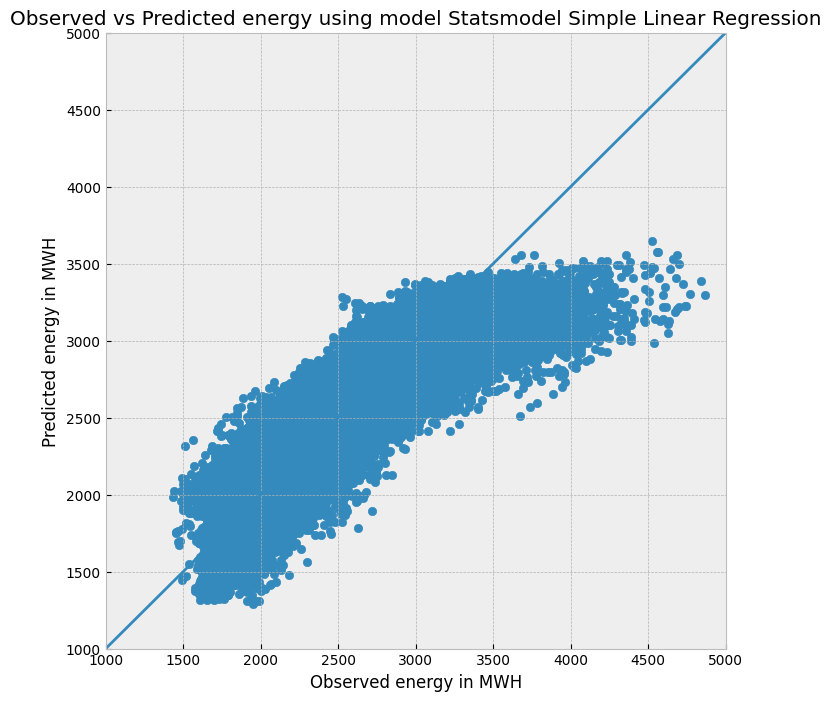

In [18]:
plot_predvstrue_reg(m.fittedvalues, sdge.SDGE, model_name="Statsmodel Simple Linear Regression")

### SkLearn Linear Regression

In [19]:
sdge_lin.drop(
    [
        "Date",
        "STATION",
        "AC_kW",
        "DailyCoolingDegreeDays",
        "DailyHeatingDegreeDays",
        "weekday_Monday",
        "weekday_Saturday",
        "weekday_Sunday",
        "weekday_Thursday",
        "weekday_Tuesday",
        "weekday_Wednesday",
        "holiday_1",
        "day_2",
        "day_3",
        "day_4",
        "day_5",
        "day_6",
        "day_7",
        "day_8",
        "day_9",
        "day_10",
        "day_11",
        "day_12",
        "day_13",
        "day_14",
        "day_15",
        "day_16",
        "day_17",
        "day_18",
        "day_19",
        "day_20",
        "day_21",
        "day_22",
        "day_23",
        "day_24",
        "day_25",
        "day_26",
        "day_27",
        "day_28",
        "day_29",
        "day_30",
        "day_31",
    ],
    axis=1,
    inplace=True,
)


In [20]:
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW"]  # other columns are binary values
X_train, X_test, y_train, y_test = train_test(sdge_lin, test_size=0.15, scale=True, cols_to_transform=cols_to_transform)

# This creates a LinearRegression object
lm = LinearRegression()


LinearRegression()

In [23]:
lm.fit(X_train, y_train)
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None)

LinearRegression()

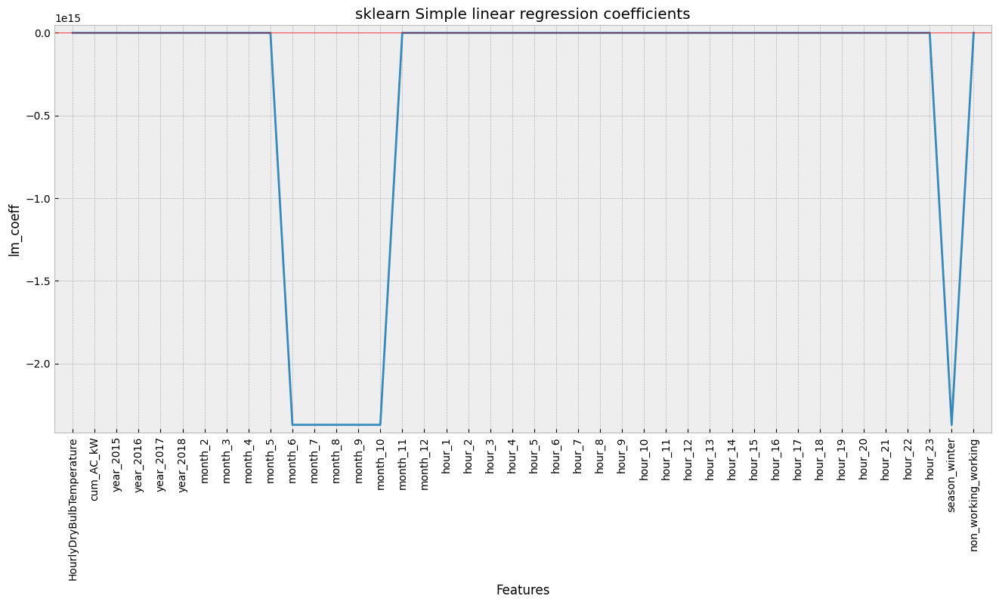

In [24]:
_ = plt.figure(figsize=(16, 7))
_ = plt.plot(range(len(X_train.columns)), lm.coef_)
_ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation=90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth=0.5, color="r")
_ = plt.title("sklearn Simple linear regression coefficients")
_ = plt.ylabel("lm_coeff")
_ = plt.xlabel("Features")


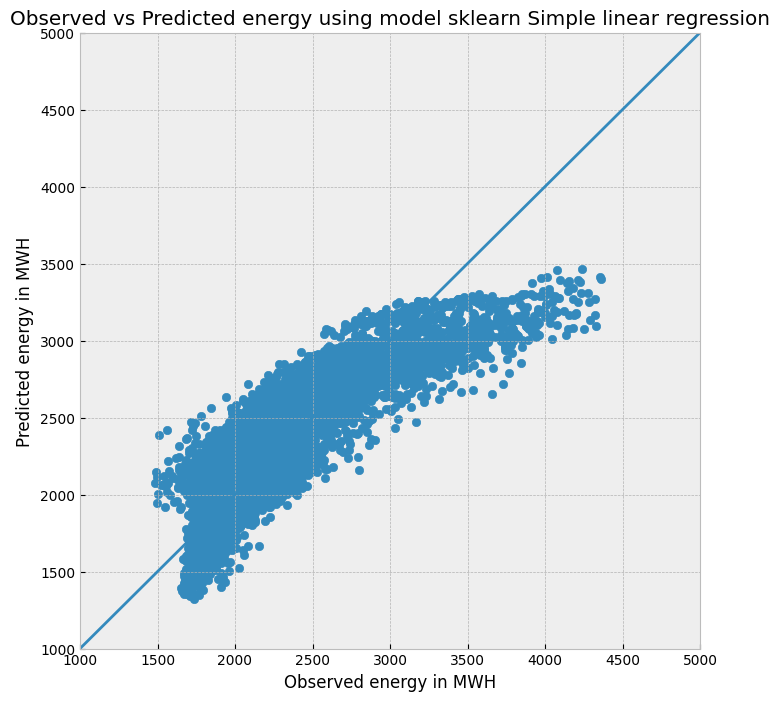

In [25]:
plot_predvstrue_reg(lm.predict(X_test), y_test, model_name="sklearn Simple linear regression")


In [26]:
error_metrics(lm.predict(X_train), y_train, model_name="Simple linear regression with scaling", test=False)


Error metrics for model Simple linear regression with scaling
RMSE or Root mean squared error: 230.23
Variance score: 0.77
Mean Absolute Error: 170.46
Mean Absolute Percentage Error: 7.14 %


In [27]:
error_metrics(lm.predict(X_test), y_test, model_name="Simple linear regression with scaling", test=True)



Error metrics for model Simple linear regression with scaling
RMSE or Root mean squared error: 255.73
Variance score: 0.73
Mean Absolute Error: 195.56
Mean Absolute Percentage Error: 8.41 %


In [28]:
plot_ts_pred(
    y_test,
    lm.predict(X_test),
    model_name="Simple linear regression with scaling",
    og_ts_opacity=0.5,
    pred_ts_opacity=0.5,
)


### Ridge Regression

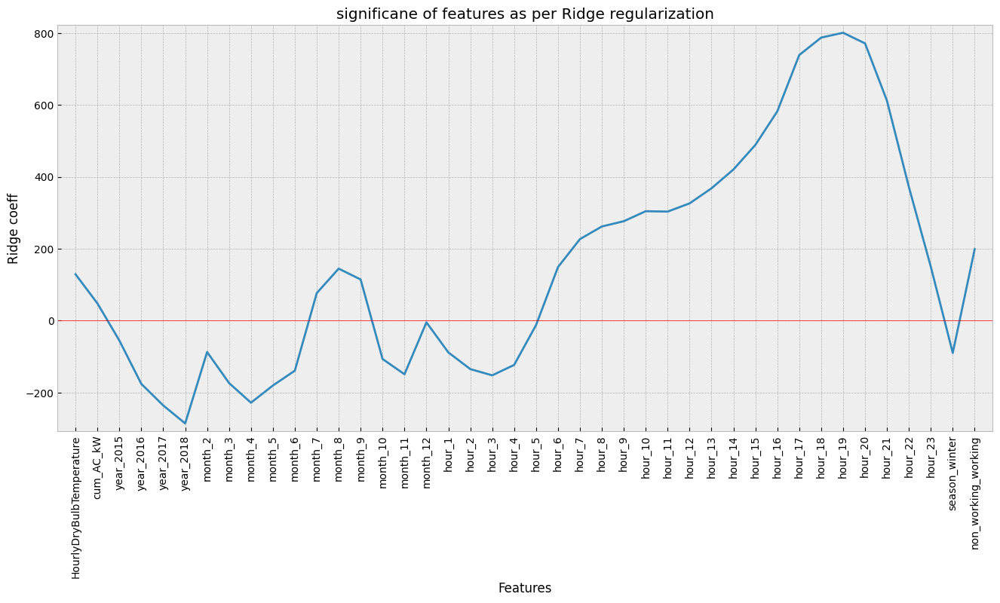

In [30]:
from sklearn.linear_model import Ridge

# Instantiate a ridge regressor: ridge
ridge = Ridge(alpha=0.2)
# Tried different values from 0.1 to 0.8, results don't change much

# Fit the regressor to the data
ridge.fit(X_train, y_train)

# Compute and print the coefficients
ridge_coef = ridge.coef_
# print(ridge_coef)

# Plot the coefficients
_ = plt.figure(figsize=(16, 7))
_ = plt.plot(range(len(X_train.columns)), ridge_coef)
_ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation=90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth=0.5, color="r")
_ = plt.title("significane of features as per Ridge regularization")
_ = plt.ylabel("Ridge coeff")
_ = plt.xlabel("Features")


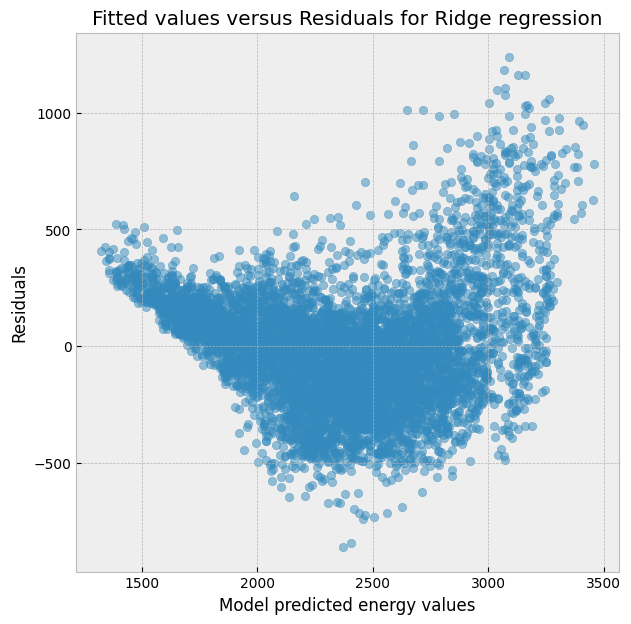

In [31]:
residuals = y_test - ridge.predict(X_test)
_ = plt.figure(figsize=(7, 7))
_ = plt.scatter(ridge.predict(X_test), residuals, alpha=0.5)
_ = plt.xlabel("Model predicted energy values")
_ = plt.ylabel("Residuals")
_ = plt.title("Fitted values versus Residuals for Ridge regression")


In [32]:
print("Ridge regression on training set")
error_metrics(ridge.predict(X_train), y_train, model_name="Ridge regression with scaling", test=False)

print("\nRidge regression on test set")
error_metrics(ridge.predict(X_test), y_test, model_name="Ridge regression with scaling", test=True)


Ridge regression on training set

Error metrics for model Ridge regression with scaling
RMSE or Root mean squared error: 230.15
Variance score: 0.77
Mean Absolute Error: 170.18
Mean Absolute Percentage Error: 7.13 %

Ridge regression on test set

Error metrics for model Ridge regression with scaling
RMSE or Root mean squared error: 254.79
Variance score: 0.73
Mean Absolute Error: 194.78
Mean Absolute Percentage Error: 8.36 %


In [33]:
plot_ts_pred(y_test, ridge.predict(X_test), model_name="Ridge regression", og_ts_opacity=0.5, pred_ts_opacity=0.5)


### Reducing the feature space

In [35]:
sdge1 = pd.read_csv(os.path.join(path_folder, "data/hourly1418_energy_temp_PV.csv"), index_col="Dates", parse_dates=["Dates", "Date"])
print(sdge1.shape)
sdge1.head()

(43824, 16)


,SDGE,Date,year,month,day,hour,weekday,season,holiday,non_working,STATION,DailyCoolingDegreeDays,DailyHeatingDegreeDays,HourlyDryBulbTemperature,AC_kW,cum_AC_kW
Dates,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,2096.0,2014-01-01,2014,1,1,0,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.0,0.0,220992.227
2014-01-01 01:00:00,1986.0,2014-01-01,2014,1,1,1,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.5,0.0,220992.227
2014-01-01 02:00:00,1936.0,2014-01-01,2014,1,1,2,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.8,0.0,220992.227
2014-01-01 03:00:00,1896.0,2014-01-01,2014,1,1,3,Wednesday,winter,1,non-working,72290023188,0.0,7.0,50.0,0.0,220992.227
2014-01-01 04:00:00,1899.0,2014-01-01,2014,1,1,4,Wednesday,winter,1,non-working,72290023188,0.0,7.0,48.8,0.0,220992.227


In [36]:
hour_dict = {
    "morning": list(np.arange(7, 13)),
    "afternoon": list(np.arange(13, 16)),
    "evening": list(np.arange(16, 22)),
    "night": [22, 23, 0, 1, 2, 3, 4, 5, 6],
}


In [38]:
sdge1["time_of_day"] = sdge1["hour"].apply(time_of_day)
sdge1.head()

,SDGE,Date,year,month,day,hour,weekday,season,holiday,non_working,STATION,DailyCoolingDegreeDays,DailyHeatingDegreeDays,HourlyDryBulbTemperature,AC_kW,cum_AC_kW,time_of_day
Dates,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,2096.0,2014-01-01,2014,1,1,0,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.0,0.0,220992.227,night
2014-01-01 01:00:00,1986.0,2014-01-01,2014,1,1,1,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.5,0.0,220992.227,night
2014-01-01 02:00:00,1936.0,2014-01-01,2014,1,1,2,Wednesday,winter,1,non-working,72290023188,0.0,7.0,51.8,0.0,220992.227,night
2014-01-01 03:00:00,1896.0,2014-01-01,2014,1,1,3,Wednesday,winter,1,non-working,72290023188,0.0,7.0,50.0,0.0,220992.227,night
2014-01-01 04:00:00,1899.0,2014-01-01,2014,1,1,4,Wednesday,winter,1,non-working,72290023188,0.0,7.0,48.8,0.0,220992.227,night


In [39]:
cat_cols1 = ["month", "day", "hour", "weekday", "season", "holiday", "non_working", "time_of_day"]
# not including year above to capture the decreasing energy trend over increasing value of years
for col in cat_cols1:
    sdge1[col] = sdge1[col].astype("category")


In [40]:
cols_use = ["SDGE", "year", "time_of_day", "season", "non_working", "HourlyDryBulbTemperature", "cum_AC_kW"]
sdge1_lin = pd.get_dummies(sdge1[cols_use], drop_first = True)
sdge1_lin.head()

,SDGE,year,HourlyDryBulbTemperature,cum_AC_kW,time_of_day_evening,time_of_day_morning,time_of_day_night,season_winter,non_working_working
Dates,,,,,,,,,
2014-01-01 00:00:00,2096.0,2014,51.0,220992.227,False,False,True,True,False
2014-01-01 01:00:00,1986.0,2014,51.5,220992.227,False,False,True,True,False
2014-01-01 02:00:00,1936.0,2014,51.8,220992.227,False,False,True,True,False
2014-01-01 03:00:00,1896.0,2014,50.0,220992.227,False,False,True,True,False
2014-01-01 04:00:00,1899.0,2014,48.8,220992.227,False,False,True,True,False


In [41]:
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW", "year"]
X_train, X_test, y_train, y_test = train_test(
    sdge1_lin, test_size=0.15, scale=True, cols_to_transform=cols_to_transform, include_test_scale=False
)


### Elastic Net Regression

In [43]:
data = sdge1_lin
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW", "year"]
l1_space = np.linspace(0, 1, 30)
alpha_space = np.logspace(-2, 0, 30)


Tuned ElasticNet l1 ratio: {'alpha': 1.0, 'l1_ratio': 0.9655172413793103}
Tuned ElasticNet R squared: 0.5993895343153239
Tuned ElasticNet RMSE: 311.883248051392


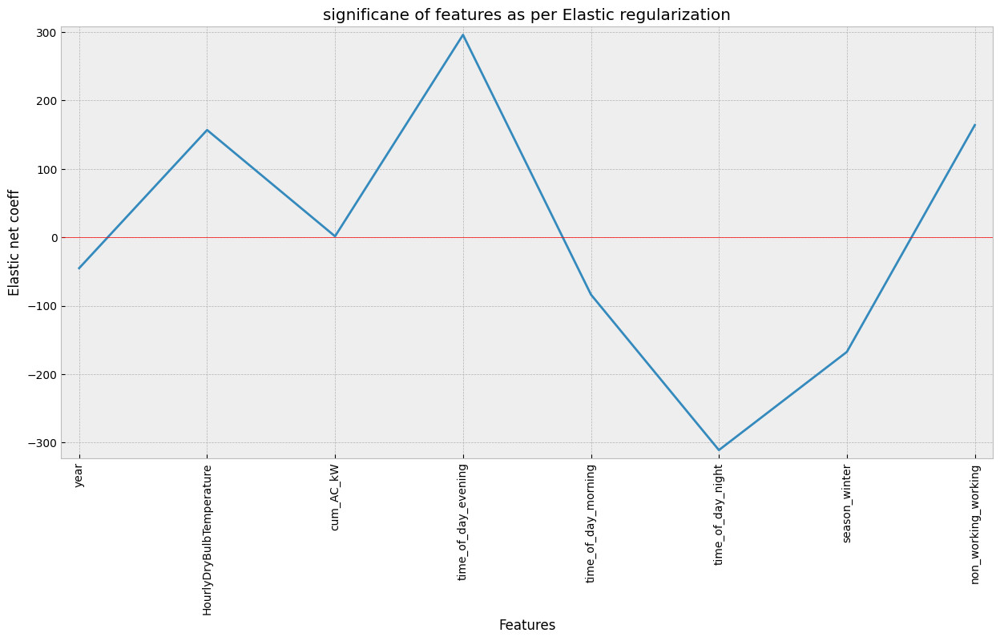

<Figure size 500x500 with 0 Axes>

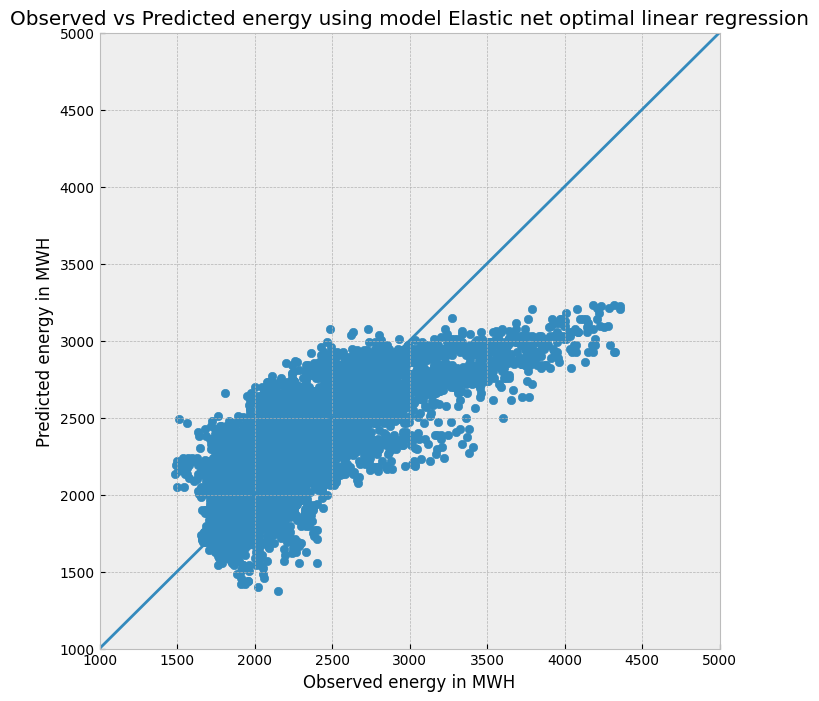

In [46]:
warnings.filterwarnings("ignore")
X_train, X_test, y_train, y_test, elastic_net_opt = trend_model(
    data=data,
    cols_to_transform=cols_to_transform,
    l1_space=l1_space,
    alpha_space=alpha_space,
    scale=True,
    test_size=0.15,
    include_test_scale=False,
)


In [47]:
plot_ts_pred(
    y_test,
    elastic_net_opt.predict(X_test),
    model_name="Optimal Elastic net regression",
    og_ts_opacity=0.5,
    pred_ts_opacity=0.5,
)


In [48]:
print("Elastic net regression on training set")
error_metrics(
    elastic_net_opt.predict(X_train),
    y_train,
    model_name="Tuned elastic net regression with reduced hour space",
    test=False,
)

print("\nElastic net regression on test set")
error_metrics(
    elastic_net_opt.predict(X_test),
    y_test,
    model_name="Tuned elastic net regression with reduced hour space",
    test=True,
)


Elastic net regression on training set

Error metrics for model Tuned elastic net regression with reduced hour space
RMSE or Root mean squared error: 277.96
Variance score: 0.66
Mean Absolute Error: 212.49
Mean Absolute Percentage Error: 9.00 %

Elastic net regression on test set

Error metrics for model Tuned elastic net regression with reduced hour space
RMSE or Root mean squared error: 311.88
Variance score: 0.60
Mean Absolute Error: 236.89
Mean Absolute Percentage Error: 9.98 %


### Random Forest Regression

In [50]:
n_estimators = [int(x) for x in np.linspace(10, 200, 10, endpoint=True)]
max_features = ["auto", "sqrt"]
max_depth = list(range(1, 6))
# Create the random grid
random_grid = {"n_estimators": n_estimators, "max_features": max_features, "max_depth": max_depth}
print(random_grid)


{'n_estimators': [10, 31, 52, 73, 94, 115, 136, 157, 178, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [1, 2, 3, 4, 5]}


In [52]:
rf = RandomForestRegressor()

# Creating a time series split as discussed in the Introduction
tscv = TimeSeriesSplit(n_splits=5)
# Random search of parameters
rf_random = RandomizedSearchCV(
    estimator=rf, param_distributions=random_grid, cv=tscv, verbose=2, random_state=42, n_jobs=-1
)

# Fit the random search model
rf_random.fit(X_train, y_train)

rf_random.best_params_


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.1s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.1s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.1s
[CV] END ...max_depth=3, max_features=auto, n_estimators=115; total time=   0.0s
[CV] END ...max_depth=3, max_features=auto, n_estimators=115; total time=   0.0s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.1s
[CV] END ...max_depth=3, max_features=auto, n_es

{'n_estimators': 10, 'max_features': 'sqrt', 'max_depth': 4}

In [53]:
rf_random.score(X_train, y_train)

0.7203751444613862

In [54]:
rf_random.score(X_test, y_test)

0.6512659437430492

In [55]:
plot_ts_pred(
    y_test,
    rf_random.predict(X_test),
    model_name="Tuned Random forest with reduced hour space",
    og_ts_opacity=0.5,
    pred_ts_opacity=0.5,
)


In [56]:
print("Tuned Random forest errors on training set")
error_metrics(rf_random.predict(X_train), y_train, model_name="Tuned Random forest with reduced hour space", test=False)
print("\nTuned Random forest errors on test set")
error_metrics(rf_random.predict(X_test), y_test, model_name="Tuned Random forest with reduced hour space", test=True)


Tuned Random forest errors on training set

Error metrics for model Tuned Random forest with reduced hour space
RMSE or Root mean squared error: 253.26
Variance score: 0.72
Mean Absolute Error: 192.44
Mean Absolute Percentage Error: 8.13 %

Tuned Random forest errors on test set

Error metrics for model Tuned Random forest with reduced hour space
RMSE or Root mean squared error: 290.99
Variance score: 0.65
Mean Absolute Error: 219.26
Mean Absolute Percentage Error: 9.26 %


### Adding lags as X variables (Elastic Net & RF)

In [57]:
for i in range(24):
    sdge1_lin["lag" + str(i + 1)] = sdge1_lin["SDGE"].shift(i + 1)


In [60]:
lag_sdge = sdge1_lin.dropna()

#### Fitting Elastic Net Regression on the Lag data

In [61]:
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW", "year"]
# Adding the energy consumption lags to the columns to transform
list_lags = ["lag" + str(i + 1) for i in range(24)]
cols_to_transform.extend(list_lags)

X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(
    lag_sdge, test_size=0.15, scale=True, cols_to_transform=cols_to_transform
)


In [62]:
elastic_net_lag = ElasticNet(l1_ratio=1, alpha=0.2)
elastic_net_lag.fit(X_train_lag, y_train_lag)


ElasticNet(alpha=0.2, l1_ratio=1)

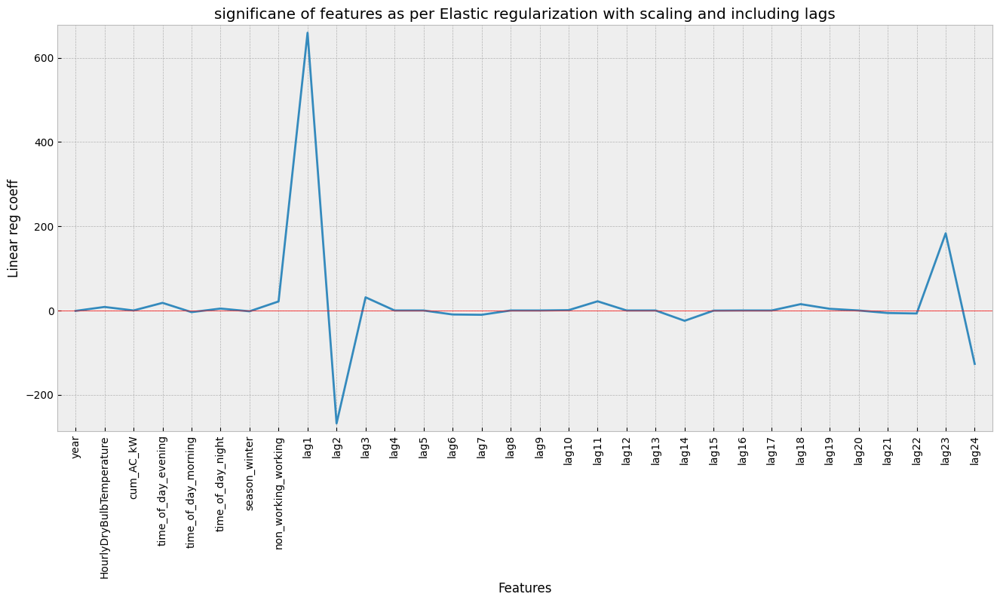

In [63]:
_ = plt.figure(figsize=(16, 7))
_ = plt.plot(range(len(X_train_lag.columns)), elastic_net_lag.coef_)
_ = plt.xticks(range(len(X_train_lag.columns)), X_train_lag.columns.values, rotation=90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth=0.5, color="r")
_ = plt.title("significane of features as per Elastic regularization with scaling and including lags")
_ = plt.ylabel("Linear reg coeff")
_ = plt.xlabel("Features")


#### Fitting Random Forest on the lag data

In [64]:
rf = RandomForestRegressor()
tscv = TimeSeriesSplit(n_splits=5)
# Random search of parameters
rflag = RandomizedSearchCV(
    estimator=rf, param_distributions=random_grid, cv=tscv, verbose=2, random_state=42, n_jobs=-1
)

# Fit the random search model
rflag.fit(X_train_lag, y_train_lag)

rflag.best_params_


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=73; total time=   0.0s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.3s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.4s
[CV] END ....max_depth=4, max_features=sqrt, n_estimators=10; total time=   0.4s
[CV] END ...max_depth=3, max_features=auto, n_estimators=115; total time=   0.0s
[CV] END ....max_depth=3, max_features=sqrt, n_estimators=73; total time=   1.1s
[CV] END ...max_depth=3, max_features=auto, n_estimators=115; total time=   0.0s
[CV] END ...max_depth=3, max_features=auto, n_es

{'n_estimators': 10, 'max_features': 'sqrt', 'max_depth': 4}

In [65]:
print("Random forest errors with lags on training")
error_metrics(rflag.predict(X_train_lag), y_train_lag, model_name="Random forest with all lags", test=False)
print("\nRandom forest errors with lags on test")
error_metrics(rflag.predict(X_test_lag), y_test_lag, model_name="Random forest with all lags", test=True)
print("\nElastic net errors with lags on train")
error_metrics(elastic_net_lag.predict(X_train_lag), y_train_lag, model_name="Elastic net with all lags", test=False)
print("\nElastic net errors with lags on test")
error_metrics(elastic_net_lag.predict(X_test_lag), y_test_lag, model_name="Elastic net with all lags", test=True)


Random forest errors with lags on training

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 122.19
Variance score: 0.93
Mean Absolute Error: 91.52
Mean Absolute Percentage Error: 3.91 %

Random forest errors with lags on test

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 122.78
Variance score: 0.94
Mean Absolute Error: 91.05
Mean Absolute Percentage Error: 3.97 %

Elastic net errors with lags on train

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 51.59
Variance score: 0.99
Mean Absolute Error: 36.36
Mean Absolute Percentage Error: 1.51 %

Elastic net errors with lags on test

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 50.75
Variance score: 0.99
Mean Absolute Error: 37.36
Mean Absolute Percentage Error: 1.58 %


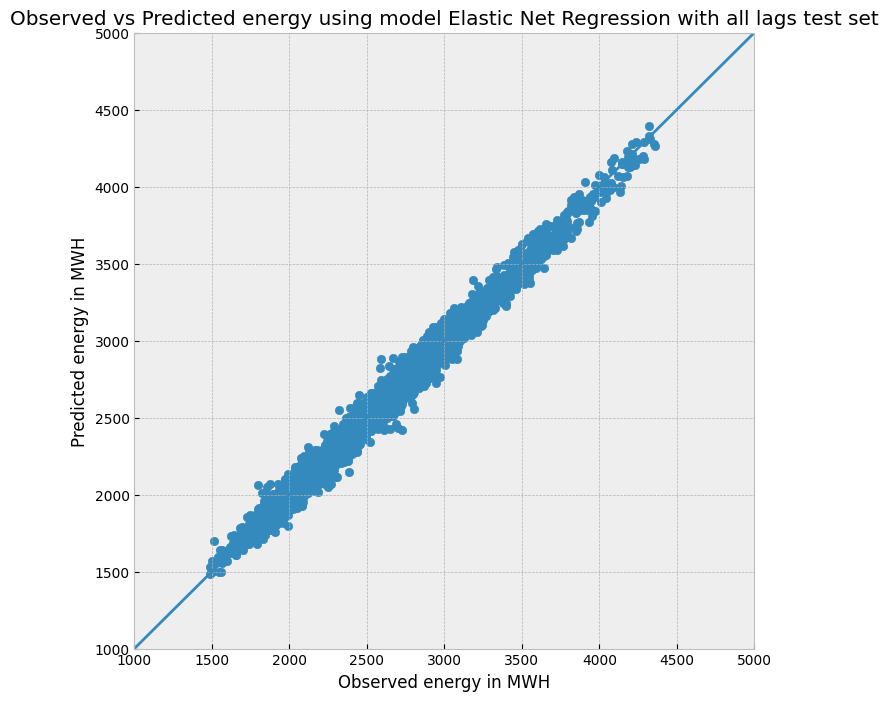

In [66]:
plot_predvstrue_reg(
    elastic_net_lag.predict(X_test_lag), y_test_lag, model_name="Elastic Net Regression with all lags test set"
)


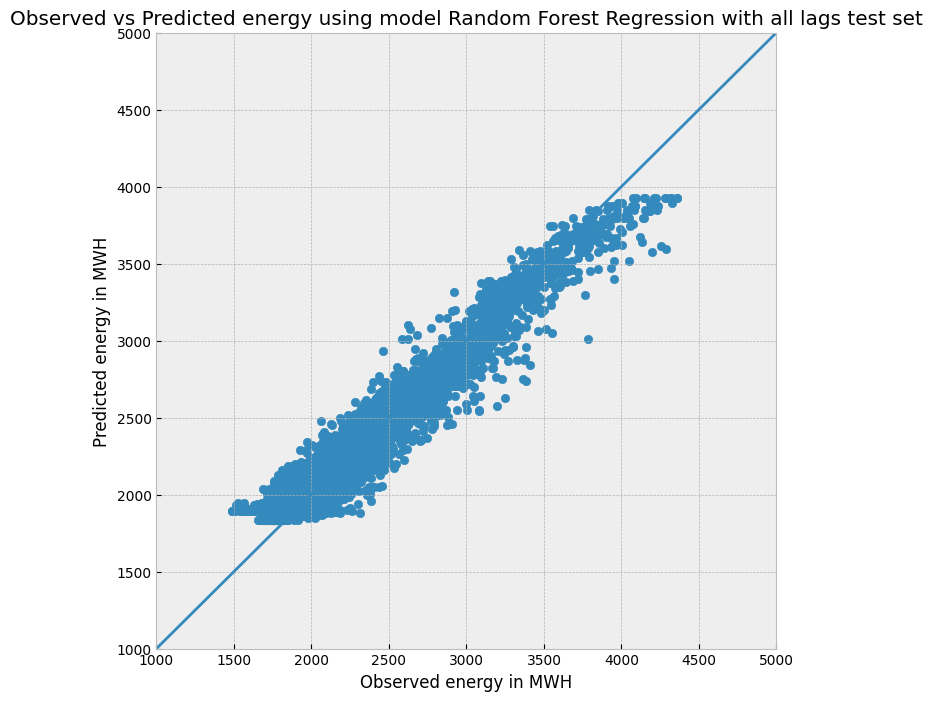

In [67]:
plot_predvstrue_reg(rflag.predict(X_test_lag), y_test_lag, model_name="Random Forest Regression with all lags test set")


In [68]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=X_test_lag.index, y=np.array(y_test_lag), name="observed", line_color="deepskyblue", opacity=0.5)
)

fig.add_trace(
    go.Scatter(
        x=X_test_lag.index,
        y=rflag.predict(X_test_lag),
        name="Random forest predictions",
        line_color="lightslategrey",
        opacity=0.5,
    )
)

fig.add_trace(
    go.Scatter(
        x=X_test_lag.index,
        y=elastic_net_lag.predict(X_test_lag),
        name="Elastic net predictions",
        line_color="lightcoral",
        opacity=0.5,
    )
)

fig.update_layout(
    title_text="Observed test set vs Predicted energy using Random forest & elastic net \
reg using lags upto 24h on test set",
    xaxis_rangeslider_visible=True,
)
fig.show()


### Time Series Features and Models

In [79]:
ts_sdge = pd.DataFrame(sdge1_lin["SDGE"], columns=['SDGE'])
ts_sdge.tail()

,SDGE
Dates,
2018-12-31 19:00:00,2609.685890
2018-12-31 20:00:00,2504.283858
2018-12-31 21:00:00,2389.460971
2018-12-31 22:00:00,2259.741640
2018-12-31 23:00:00,2123.183153


In [70]:
plot_timeseries(ts_sdge["SDGE"], title="Original data set")

Dates
2014-01-01 00:00:00   -281.350242
2014-01-01 01:00:00   -386.023111
2014-01-01 02:00:00   -448.506518
2014-01-01 03:00:00   -478.883298
2014-01-01 04:00:00   -469.076471
Name: seasonal, dtype: float64


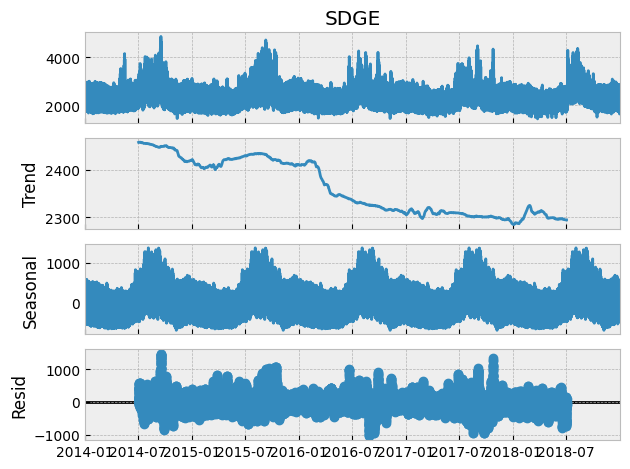

In [80]:
decomp = sm.tsa.seasonal_decompose(ts_sdge['SDGE'], period=24*365)

print(decomp.seasonal.head()) # checking the seasonal component
_ = decomp.plot()

In [83]:
ts_sdge['seasonal'] = decomp.seasonal

In [84]:
plot_timeseries(ts_sdge["seasonal"], title="Seasonal component")


In [85]:
ts_sdge['trend'] = decomp.trend

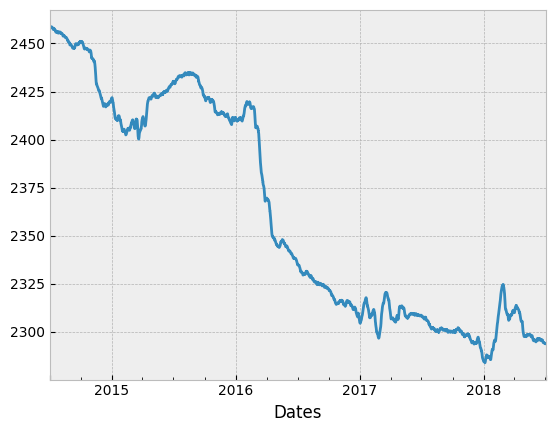

In [86]:
ts_sdge['trend'].dropna().plot()
plt.show()

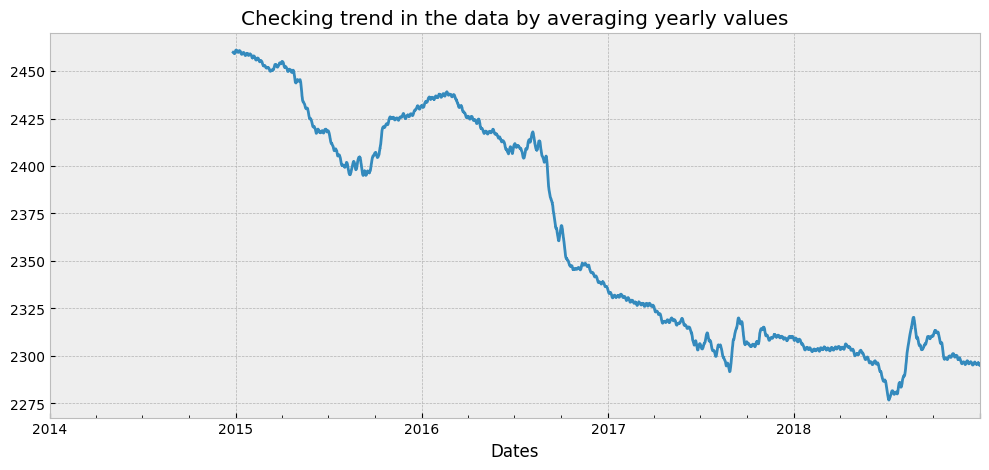

In [87]:
_ = sdge["SDGE"].rolling(window=24 * 30 * 12).mean().plot(figsize=(12, 5))
_ = plt.title("Checking trend in the data by averaging yearly values")


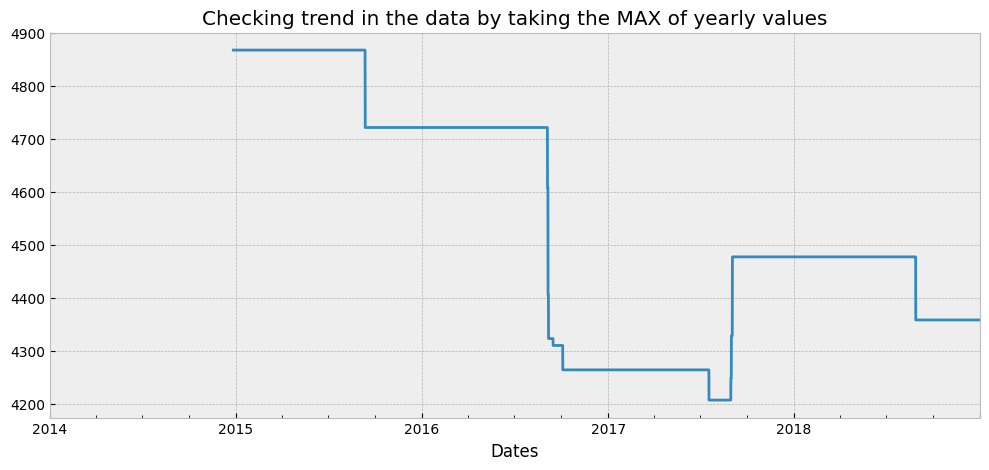

In [88]:
_ = sdge["SDGE"].rolling(window=24 * 30 * 12).max().plot(figsize=(12, 5))
_ = plt.title("Checking trend in the data by taking the MAX of yearly values")


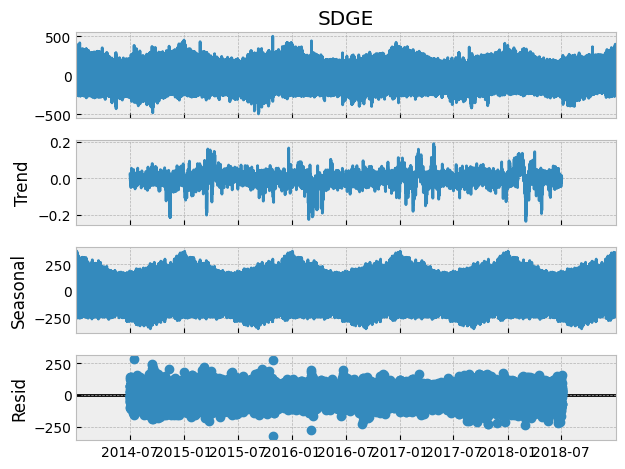

In [89]:
decomp_diff1 = sm.tsa.seasonal_decompose(ts_sdge["SDGE"].diff().dropna(), period=24 * 365)
_ = decomp_diff1.plot()


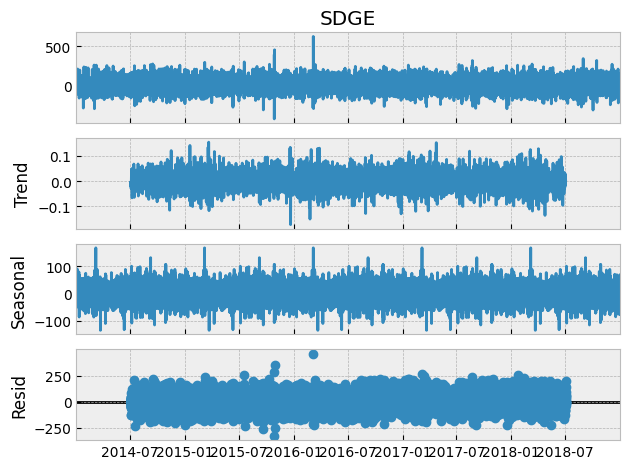

In [90]:
decomp_diff24 = sm.tsa.seasonal_decompose(ts_sdge["SDGE"].diff().dropna().diff(24).dropna(), period=24 * 365)
_ = decomp_diff24.plot()


Differencing the dataset once and then with the period of 24 hours further diminishes any trend and seasonality effects and seems to render the dataset stationary.

### Dicky Fuller test of Stationarity

In [93]:
print("for no differencing\n")
run_adfuller(ts_sdge["SDGE"])
print("\nfor single differencing\n")
run_adfuller(ts_sdge["SDGE"].diff().dropna())
print("\nfor differenced data set over lags 24 after single differencing\n")
run_adfuller(ts_sdge["SDGE"].diff().dropna().diff(24).dropna())


for no differencing

t-stat -10.75336391138105
p-value 2.6306348577681677e-19
#lags used 55
critical values {'1%': -3.4304994170070295, '5%': -2.861606039041269, '10%': -2.5668051504336344}

for single differencing

t-stat -31.881870452429123
p-value 0.0
#lags used 55
critical values {'1%': -3.430499420421149, '5%': -2.8616060405501966, '10%': -2.566805151236794}

for differenced data set over lags 24 after single differencing

t-stat -44.35188189610492
p-value 0.0
#lags used 55
critical values {'1%': -3.4304995024068514, '5%': -2.861606076785167, '10%': -2.5668051705236494}


### Exponential smoothing

In [95]:
plot_ewma(ts_sdge["SDGE"], 0.3)


### Correlation with the past values

#### Plotting the ACF and PACF plots

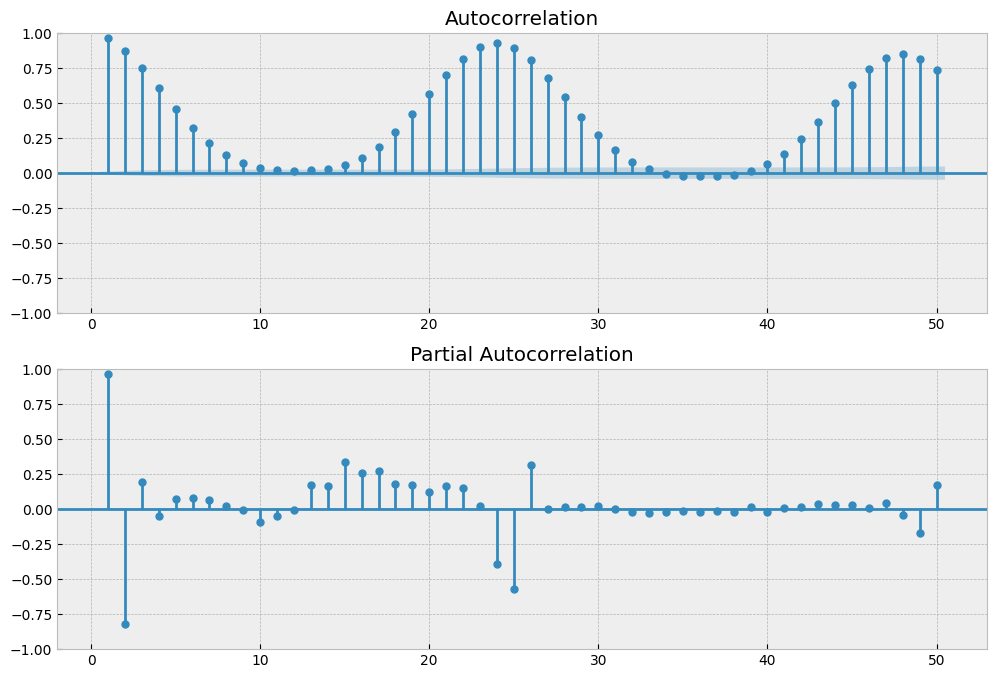

In [98]:
dfacf = []
dfacf = ts_sdge['SDGE']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

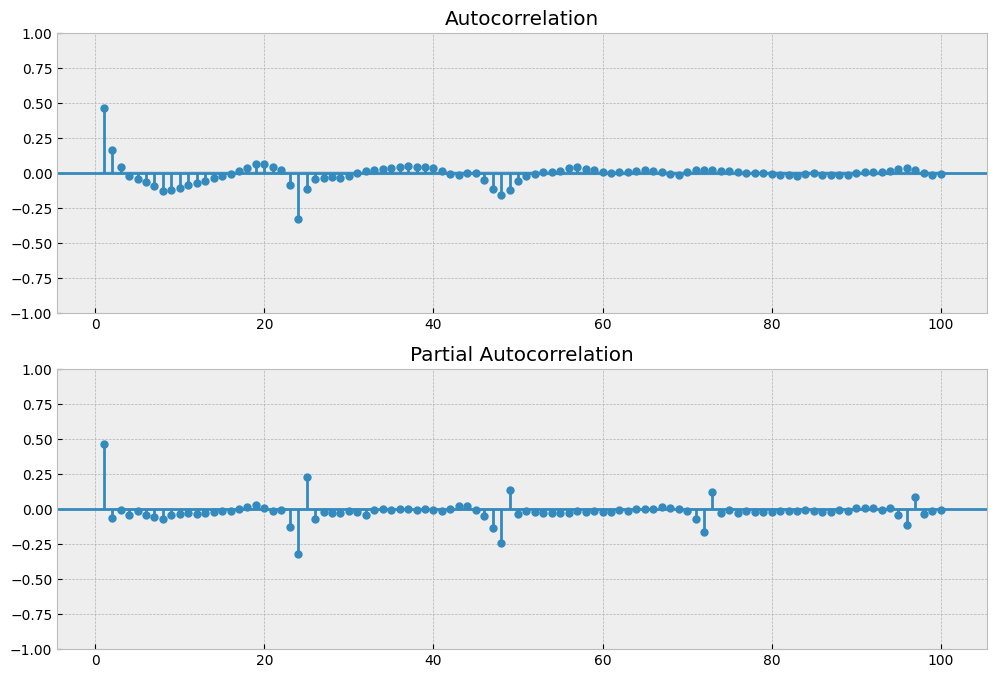

In [99]:
dfacf = []
dfacf = ts_sdge["SDGE"]
dfacf = dfacf.diff().dropna()
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24 * 365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags=lags, figsize=(12, 8))


### Handling Multiple seasonality

#### Adding fourier cyclical series for hour, year and week periods

In [101]:
add_fourier_terms(lag_sdge, year_k=5, week_k=5, day_k=5)


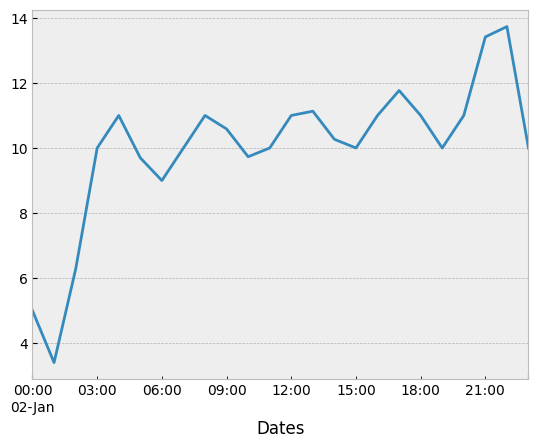

In [102]:
# Visualizing the new variables on hour seasonality
pd.plotting.register_matplotlib_converters()
_ = (
    (1 - lag_sdge.loc["01-02-2014":"01-02-2014", [col for col in lag_sdge if col.startswith("hour")]])
    .sum(axis=1)
    .plot()
)


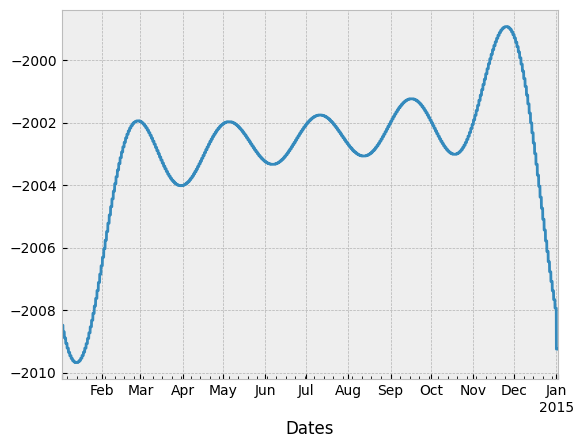

In [103]:
# Visualizing the new variables on year seasonality
_ = (
    (1 - lag_sdge.loc["01-01-2014":"01-01-2015", [col for col in lag_sdge if col.startswith("year")]])
    .sum(axis=1)
    .plot()
)


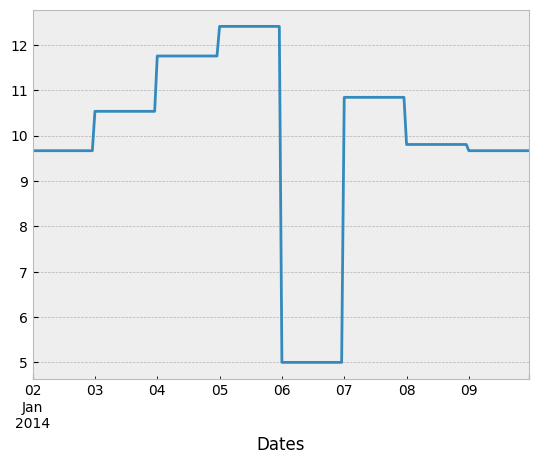

In [104]:
# Visualizing the new variables on week seasonality
_ = (
    (1 - lag_sdge.loc["01-01-2014":"01-09-2014", [col for col in lag_sdge if col.startswith("week")]])
    .sum(axis=1)
    .plot()
)


In [106]:
print((lag_sdge.columns))

Index(['SDGE', 'year', 'HourlyDryBulbTemperature', 'cum_AC_kW',
       'time_of_day_evening', 'time_of_day_morning', 'time_of_day_night',
       'season_winter', 'non_working_working', 'lag1', 'lag2', 'lag3', 'lag4',
       'lag5', 'lag6', 'lag7', 'lag8', 'lag9', 'lag10', 'lag11', 'lag12',
       'lag13', 'lag14', 'lag15', 'lag16', 'lag17', 'lag18', 'lag19', 'lag20',
       'lag21', 'lag22', 'lag23', 'lag24', 'year_sin1', 'year_cos1',
       'year_sin2', 'year_cos2', 'year_sin3', 'year_cos3', 'year_sin4',
       'year_cos4', 'year_sin5', 'year_cos5', 'week_sin1', 'week_cos1',
       'week_sin2', 'week_cos2', 'week_sin3', 'week_cos3', 'week_sin4',
       'week_cos4', 'week_sin5', 'week_cos5', 'hour_sin1', 'hour_cos1',
       'hour_sin2', 'hour_cos2', 'hour_sin3', 'hour_cos3', 'hour_sin4',
       'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object')


In [107]:
sdgecyc = lag_sdge.drop(
    [col for col in lag_sdge if col.startswith("time") or col.startswith("season") or col.startswith("lag")], axis=1
)


### SARIMAX (Fourier series)

In [109]:
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW"]
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(
    sdgecyc, test_size=0.15, scale=True, cols_to_transform=cols_to_transform
)

# Since ARIMA model uses the past lag y values, scaling the energy values as well.
# i.e. fit the scaler on y_train and transform it and also transform y_test using the same scaler if required later

scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(
    scaler1.fit_transform(y_train_lag.values.reshape(-1, 1)), index=y_train_lag.index, columns=["SDGE"]
)


In [110]:
model_opt = SARIMAX(y_train_lag, order=(2, 1, 1), seasonal_order=(1, 0, 1, 24), exog=X_train_lag, trend="c")


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [ ]:
results = model_opt.fit()
results.summary()

In [ ]:
_ = results.plot_diagnostics(figsize=(12, 7))

In [ ]:
pred = results.get_prediction(
    start=X_train_lag.index[-24 * 7], end=X_train_lag.index[-1], dynamic=True, exog=X_train_lag.iloc[-24 * 7 :, :]
)
pred_ci = pred.conf_int()

pred1 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci1 = scaler1.inverse_transform(pred.conf_int())

y_actual_train = np.squeeze(scaler1.inverse_transform(y_train_lag))
y_actual_train = pd.Series(y_actual_train, index=X_train_lag.index)

pred1 = pd.Series(pred1, index=X_train_lag.iloc[-24 * 7 :, :].index)
pred_ci1 = pd.DataFrame(pred_ci1, index=pred1.index, columns=["lower SDGE", "upper SDGE"])

lower_limits = pred_ci1.loc[:, "lower SDGE"]
upper_limits = pred_ci1.loc[:, "upper SDGE"]


In [ ]:
error_metrics(pred1, y_actual_train.iloc[-24 * 7 :], "SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week", test=False)


In [ ]:
plt.figure(figsize=(15, 7))
_ = plt.plot(y_actual_train.iloc[-24 * 7 :].index, y_actual_train.iloc[-24 * 7 :], label="observed")

# plot your mean predictions
_ = plt.plot(pred1.index, pred1.values, color="r", label="forecast")

# shade the area between your confidence limits
_ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color="pink")

# set labels, legends and show plot
_ = plt.xlabel("Date")
_ = plt.ylabel("Energy consumption MWH")
_ = plt.legend()
_ = plt.title("Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the training set: predicting the last week")


In [ ]:
pred = results.get_forecast(steps=24 * 7, exog=X_test_lag.iloc[: 24 * 7, :])
pred_ci = pred.conf_int()

pred2 = scaler1.inverse_transform(pred.predicted_mean)
pred_ci2 = scaler1.inverse_transform(pred.conf_int())

y_actual = y_test_lag.iloc[: 24 * 7]

pred2 = pd.Series(pred2, index=X_test_lag.iloc[: 24 * 7, :].index)
pred_ci2 = pd.DataFrame(pred_ci2, index=pred2.index, columns=["lower SDGE", "upper SDGE"])

lower_limits = pred_ci2.loc[:, "lower SDGE"]
upper_limits = pred_ci2.loc[:, "upper SDGE"]

# plot the predictions
plt.figure(figsize=(15, 7))
_ = plt.plot(y_actual.index, y_actual, label="observed")

# plot your mean predictions
_ = plt.plot(pred2.index, pred2.values, color="r", label="forecast")

# shade the area between your confidence limits
_ = plt.fill_between(lower_limits.index, lower_limits, upper_limits, color="pink")

# set labels, legends and show plot
_ = plt.xlabel("Date")
_ = plt.ylabel("Energy consumption MWH")
_ = plt.legend()
_ = plt.title("Testing the SARIMAX (2,1,1)x(1,0,1,24) model on the testing set: predicting the 1st week")


In [ ]:
error_metrics(pred2, y_actual, "SARIMAX(2,1,1)x(1,0,1,24) with Fourier terms 1 week", test=True)


### Random Forest regression on data with fourier terms

Tuned ElasticNet l1 ratio: {'alpha': 0.32903445623126676, 'l1_ratio': 0.6896551724137931}
Tuned ElasticNet R squared: 0.7280319122008612
Tuned ElasticNet RMSE: 256.93217560755096


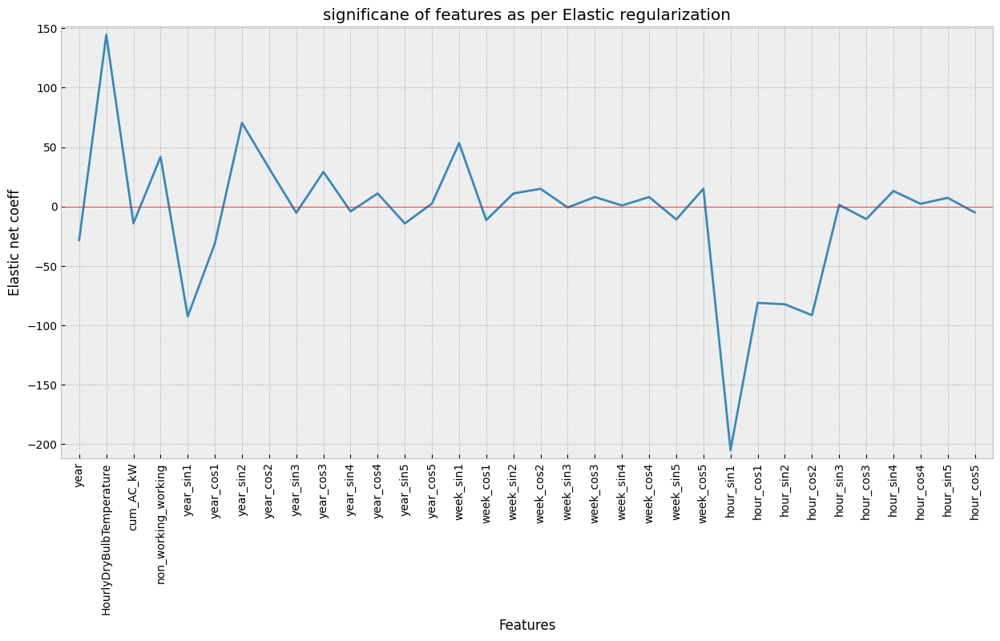

<Figure size 500x500 with 0 Axes>

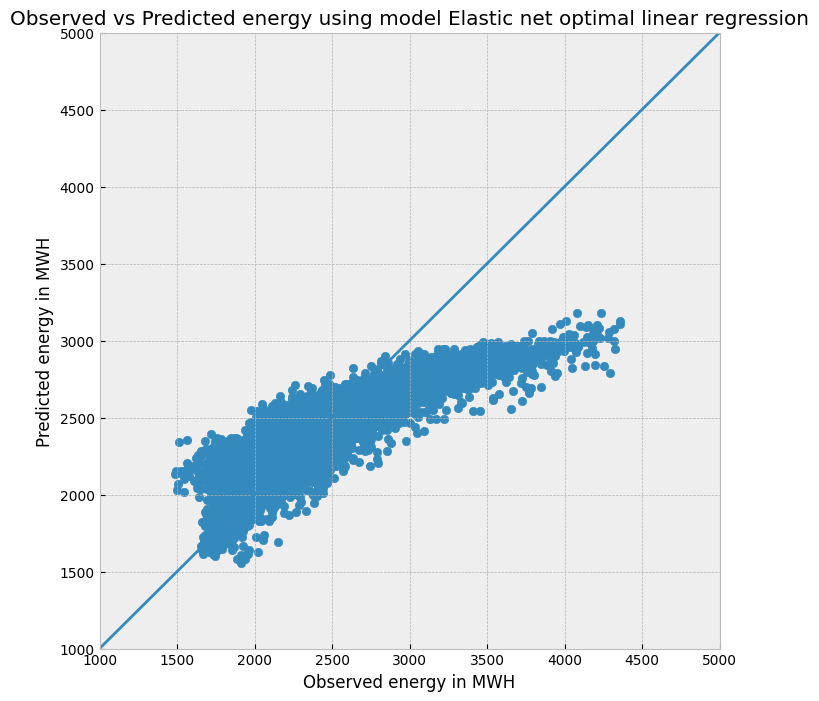

In [113]:
data = sdgecyc
cols_to_transform = ["HourlyDryBulbTemperature", "cum_AC_kW", "year"]
l1_space = np.linspace(0, 1, 30)
alpha_space = np.logspace(-2, 0, 30)

X_trainF, X_testF, y_trainF, y_testF, elastic_net_opt_F = trend_model(
    data=data,
    cols_to_transform=cols_to_transform,
    l1_space=l1_space,
    alpha_space=alpha_space,
    scale=True,
    test_size=0.15,
    include_test_scale=False,
)


In [111]:
random_grid["max_depth"] = [3, 4, 5, 6, 7, 8]
random_grid

{'n_estimators': [10, 31, 52, 73, 94, 115, 136, 157, 178, 200],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [3, 4, 5, 6, 7, 8]}

In [114]:
rf = RandomForestRegressor()
tscv = TimeSeriesSplit(n_splits=5)

# Random search of parameters
rfF = RandomizedSearchCV(estimator=rf, param_distributions=random_grid, cv=tscv, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model
rfF.fit(X_trainF, y_trainF)

rfF.best_params_


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ....max_depth=5, max_features=auto, n_estimators=94; total time=   0.0s[CV] END ...max_depth=5, max_features=auto, n_estimators=157; total time=   0.0s

[CV] END ...max_depth=5, max_features=auto, n_estimators=157; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=94; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=94; total time=   0.0s
[CV] END ...max_depth=5, max_features=auto, n_estimators=157; total time=   0.0s
[CV] END ....max_depth=5, max_features=auto, n_estimators=94; total time=   0.1s
[CV] END ....max_depth=5, max_features=auto, n_estimators=94; total time=   0.1s
[CV] END ...max_depth=5, max_features=auto, n_estimators=157; total time=   0.0s
[CV] END ....max_depth=3, max_features=auto, n_estimators=94; total time=   0.0s
[CV] END ...max_depth=5, max_features=auto, n_estimators=157; total time=   0.0s
[CV] END ....max_depth=3, max_features=auto, n_e

{'n_estimators': 73, 'max_features': 'sqrt', 'max_depth': 6}

In [115]:
rfFourier = RandomForestRegressor(
    n_estimators=rfF.best_params_["n_estimators"],
    max_features=rfF.best_params_["max_features"],
    max_depth=rfF.best_params_["max_depth"],
    random_state=42,
)
rfFourier.fit(X_trainF, y_trainF)


RandomForestRegressor(max_depth=6, max_features='sqrt', n_estimators=73,
                      random_state=42)

In [116]:
print("Training accuracy R2 using random forest is {}".format(rfF.score(X_trainF, y_trainF)))
print("Training accuracy R2 using Elastic net is {}".format(elastic_net_opt_F.score(X_trainF, y_trainF)))
print("\nTest accuracy R2 using random forest is {}".format(rfF.score(X_testF, y_testF)))
print("Test accuracy R2 using Elastic net is {}".format(elastic_net_opt_F.score(X_testF, y_testF)))


Training accuracy R2 using random forest is 0.8035323835743631
Training accuracy R2 using Elastic net is 0.701042746237448

Test accuracy R2 using random forest is 0.7376243518352206
Test accuracy R2 using Elastic net is 0.6680217021374875


In [117]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=X_testF.index, y=np.array(y_testF), name="observed", line_color="deepskyblue", opacity=0.5))

fig.add_trace(
    go.Scatter(
        x=X_testF.index,
        y=rfF.predict(X_testF),
        name="Random forest predictions",
        line_color="lightslategrey",
        opacity=0.5,
    )
)

fig.add_trace(
    go.Scatter(
        x=X_testF.index,
        y=elastic_net_opt_F.predict(X_testF),
        name="Elastic net predictions",
        line_color="lightcoral",
        opacity=0.5,
    )
)

fig.update_layout(
    title_text="Observed test set vs Predicted energy using Random forest and elastic net reg on data with \
Fourier series",
    xaxis_rangeslider_visible=True,
)
fig.show()


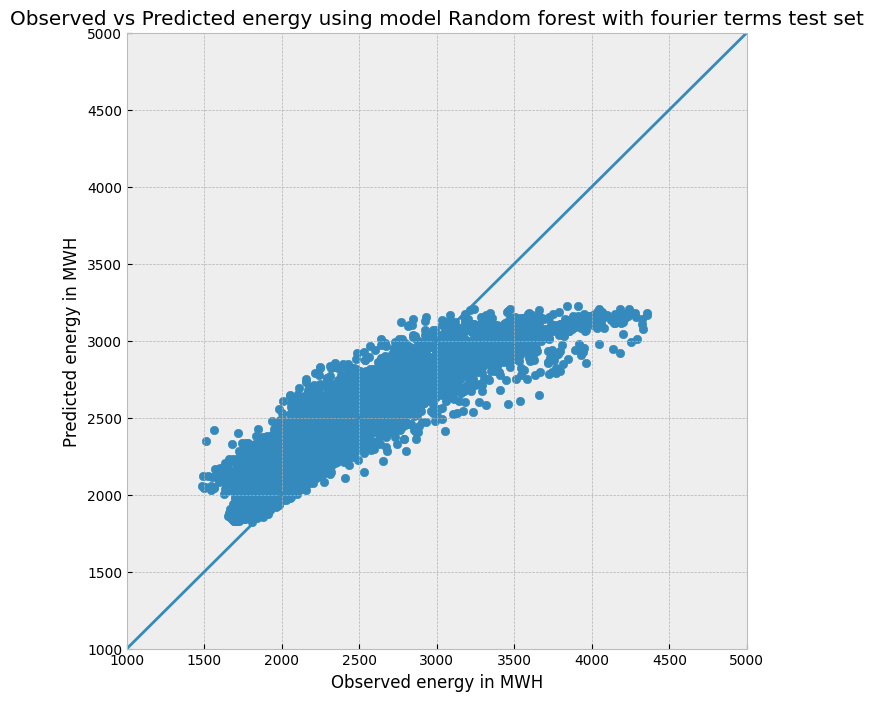

In [118]:
plot_predvstrue_reg(rfF.predict(X_testF), y_testF, model_name="Random forest with fourier terms test set")


In [119]:
print("Random forest errors with fourier terms on training")
error_metrics(rfF.predict(X_trainF), y_trainF, model_name="Tuned Random forest with fourier terms", test=False)
print("\nRandom forest errors with fourier terms on test")
error_metrics(rfF.predict(X_testF), y_testF, model_name="Tuned Random forest with fourier terms", test=True)
print("\nElastic net errors with fourier terms on train")
error_metrics(
    elastic_net_opt_F.predict(X_trainF), y_trainF, model_name="Tuned Elastic net with fourier terms", test=False
)
print("\nElastic net errors with fourier terms on test")
error_metrics(elastic_net_opt_F.predict(X_testF), y_testF, model_name="Tuned Elastic net with fourier terms", test=True)


Random forest errors with fourier terms on training

Error metrics for model Tuned Random forest with fourier terms
RMSE or Root mean squared error: 212.34
Variance score: 0.80
Mean Absolute Error: 152.60
Mean Absolute Percentage Error: 6.35 %

Random forest errors with fourier terms on test

Error metrics for model Tuned Random forest with fourier terms
RMSE or Root mean squared error: 252.36
Variance score: 0.74
Mean Absolute Error: 184.75
Mean Absolute Percentage Error: 7.85 %

Elastic net errors with fourier terms on train

Error metrics for model Tuned Elastic net with fourier terms
RMSE or Root mean squared error: 261.93
Variance score: 0.70
Mean Absolute Error: 193.98
Mean Absolute Percentage Error: 8.08 %

Elastic net errors with fourier terms on test

Error metrics for model Tuned Elastic net with fourier terms
RMSE or Root mean squared error: 283.87
Variance score: 0.67
Mean Absolute Error: 204.26
Mean Absolute Percentage Error: 8.39 %


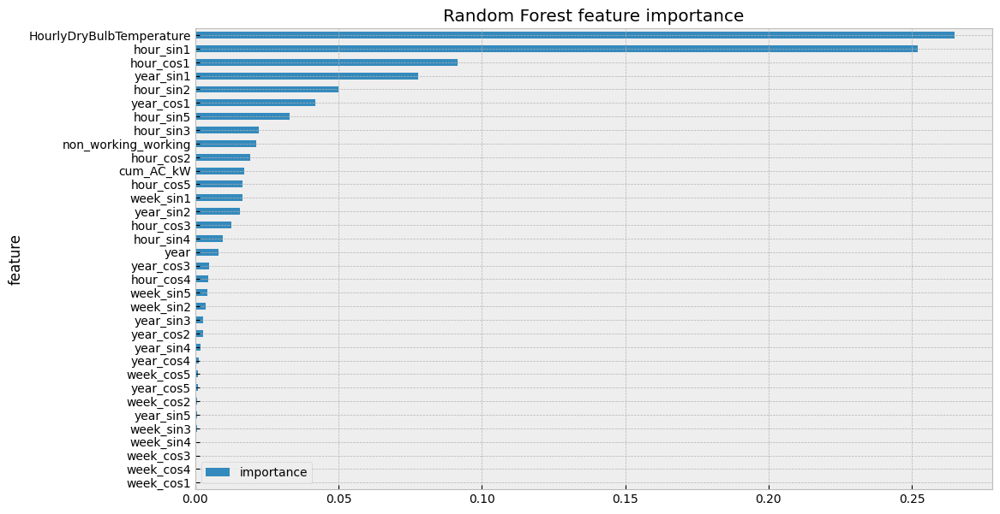

In [120]:
feat_imp = pd.DataFrame({"importance": rfFourier.feature_importances_})
feat_imp["feature"] = X_trainF.columns
feat_imp.sort_values(by="importance", ascending=False, inplace=True)
# feat_imp = feat_imp.iloc[:top_n]

feat_imp.sort_values(by="importance", inplace=True)
feat_imp = feat_imp.set_index("feature", drop=True)
_ = feat_imp.plot.barh(title="Random Forest feature importance", figsize=(12, 7))


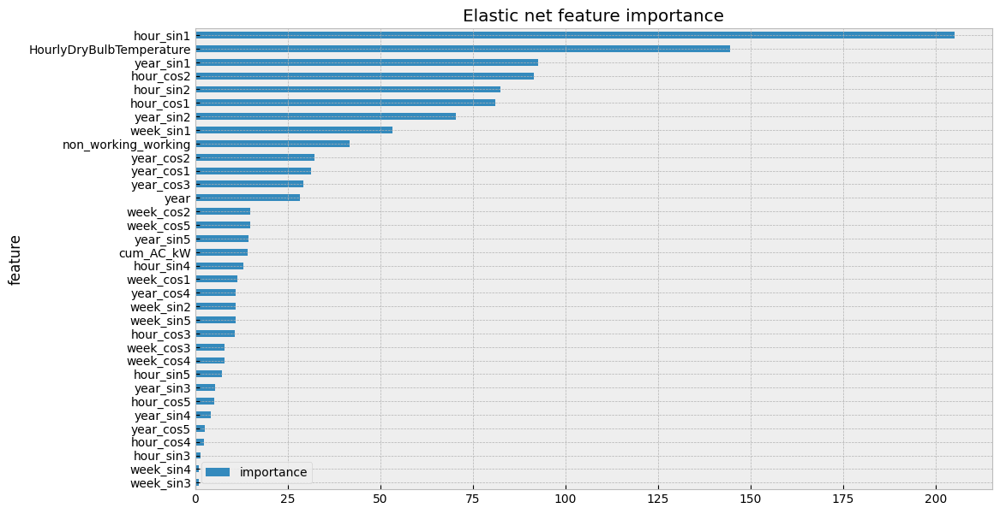

In [121]:
feat_imp = pd.DataFrame({"importance": np.abs(elastic_net_opt_F.coef_)})
feat_imp["feature"] = X_trainF.columns
feat_imp.sort_values(by="importance", ascending=False, inplace=True)
# feat_imp = feat_imp.iloc[:top_n]

feat_imp.sort_values(by="importance", inplace=True)
feat_imp = feat_imp.set_index("feature", drop=True)
_ = feat_imp.plot.barh(title="Elastic net feature importance", figsize=(12, 7))
